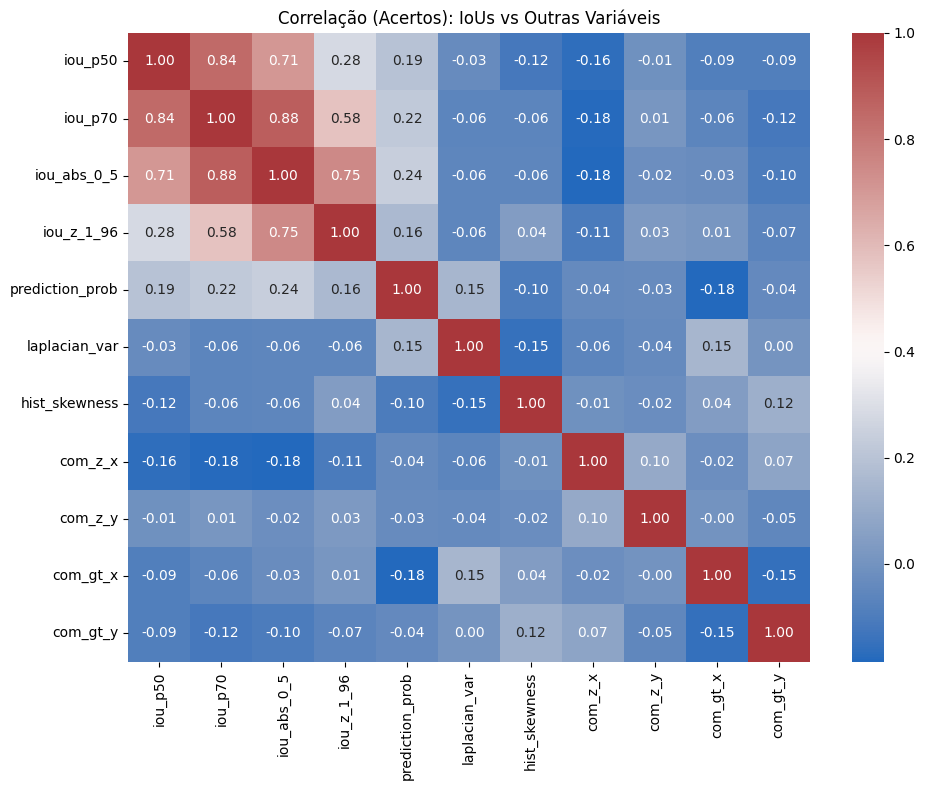

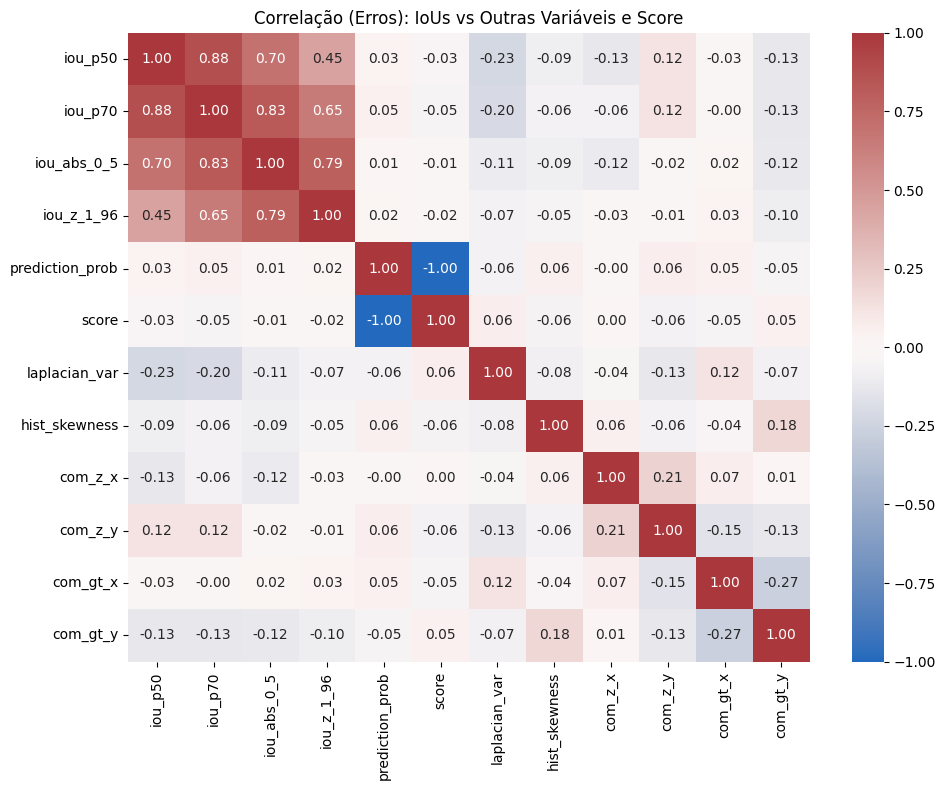

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load CSV
csv_path = '/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/results/gradcam/gradcam-metrics_300_15_4thresholds.csv'
df = pd.read_csv(csv_path)

# 2. Split into correct and wrong predictions
df['correct'] = df['predicted_class'] == df['ground_truth']
df_correct = df[df['correct']].copy()
df_wrong   = df[~df['correct']].copy()

# 3. For wrong predictions, compute 'score' = 1 - prediction_prob
df_wrong['score'] = 1.0 - df_wrong['prediction_prob']

# 4. Define variables of interest
iou_cols = ['iou_p50', 'iou_p70', 'iou_abs_0_5', 'iou_z_1_96']
other_cols = ['prediction_prob', 'score', 
              'laplacian_var', 'hist_skewness',
              'com_z_x', 'com_z_y', 'com_gt_x', 'com_gt_y']

# 5. Compute correlation matrices
# 5a. Correct: drop 'score' because undefined there
vars_corr_correct = iou_cols + ['prediction_prob'] + ['laplacian_var', 'hist_skewness', 'com_z_x', 'com_z_y', 'com_gt_x', 'com_gt_y']
corr_correct = df_correct[vars_corr_correct].corr()

# 5b. Wrong: include 'score'
vars_corr_wrong = iou_cols + ['prediction_prob', 'score'] + ['laplacian_var', 'hist_skewness', 'com_z_x', 'com_z_y', 'com_gt_x', 'com_gt_y']
corr_wrong = df_wrong[vars_corr_wrong].corr()

# 6. Display heatmaps
plt.figure(figsize=(10,8))
sns.heatmap(corr_correct, annot=True, fmt='.2f', cmap='vlag')
plt.title('Correlação (Acertos): IoUs vs Outras Variáveis')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,8))
sns.heatmap(corr_wrong, annot=True, fmt='.2f', cmap='vlag')
plt.title('Correlação (Erros): IoUs vs Outras Variáveis e Score')
plt.tight_layout()
plt.show()

# 7. (Opcional) Salvar as matrizes em CSV
corr_correct.to_csv('corr_matrix_correct.csv', index=True)
corr_wrong.to_csv('corr_matrix_wrong.csv', index=True)


Overall Pearson correlation between each IoU and score:

iou_p50        0.206752
iou_p70        0.236293
iou_abs_0_5    0.272626
iou_z_1_96     0.170545 



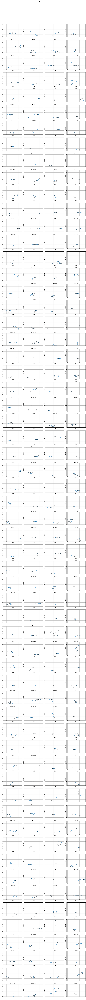

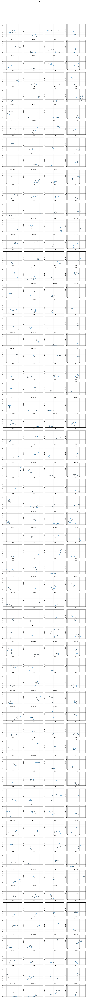

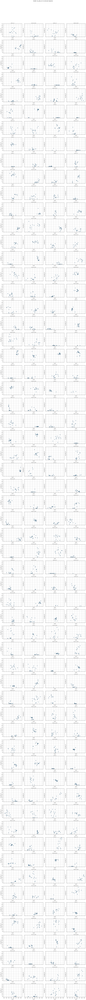

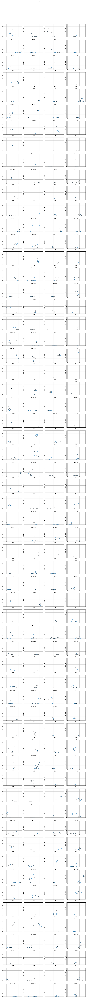

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load CSV
csv_path = '/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/results/gradcam/gradcam-metrics_300_15_4thresholds.csv'
df = pd.read_csv(csv_path)

# 2. Mark correct vs wrong and compute a unified 'score':
#    - if correct: score = prediction_prob
#    - if wrong:   score = 1 - prediction_prob
df['correct'] = df['predicted_class'] == df['ground_truth']
df['score'] = df.apply(lambda r: r['prediction_prob'] if r['correct'] else 1.0 - r['prediction_prob'], axis=1)

# 3. Overall correlation between each IoU and score (all frames)
iou_cols = ['iou_p50', 'iou_p70', 'iou_abs_0_5', 'iou_z_1_96']
corr_overall = df[iou_cols + ['score']].corr().loc[iou_cols, 'score']
print("Overall Pearson correlation between each IoU and score:\n")
print(corr_overall.to_string(), "\n")

# 4. For each IoU, plot IoU vs score per sequence
#    This will loop IoUs, and for each produce a grid of scatter plots, one per sequence.
for iou in iou_cols:
    sequences = df['sequence'].unique()
    n_seq = len(sequences)
    n_cols = 4
    n_rows = (n_seq + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows), sharex=True, sharey=True)
    axes = axes.flatten()

    for ax, seq in zip(axes, sequences):
        sub = df[df['sequence'] == seq]
        ax.scatter(sub['score'], sub[iou], alpha=0.6, edgecolor='k')
        ax.set_title(seq, fontsize=8)
        ax.set_xlabel('score')
        ax.set_ylabel(iou)
        ax.grid(True)

    # hide unused axes
    for ax in axes[len(sequences):]:
        ax.axis('off')

    plt.suptitle(f'Scatter: {iou} vs score per sequence', y=1.02)
    plt.tight_layout()
    plt.show()


/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base


Per-sequence correlation (prediction_prob vs iou_p50):

     sequence  n_correct  n_wrong  corr_correct_iou_p50  corr_wrong_iou_p50
p013_02_B_WLI         11        1             -0.629936                 NaN
p013_04_R_WLI          4       11              0.542005           -0.265995
p028_01_R_WLI          5       10             -0.291263           -0.374960
p028_02_R_LCI         12        3             -0.655175            0.604650
p028_03_R_WLI         14        1              0.739586                 NaN
p028_04_R_BLI         15        0             -0.563884                 NaN
p028_07_R_WLI         14        1              0.172995                 NaN
p028_08_R_LCI         14        1              0.701704                 NaN
p028_09_R_WLI         11        4              0.130069           -0.023289
p028_10_R_BLI         14        1             -0.652474                 NaN
p028_12_R_WLI         11        4              0.554436           -0.187259
p035_01_B_WLI         15       

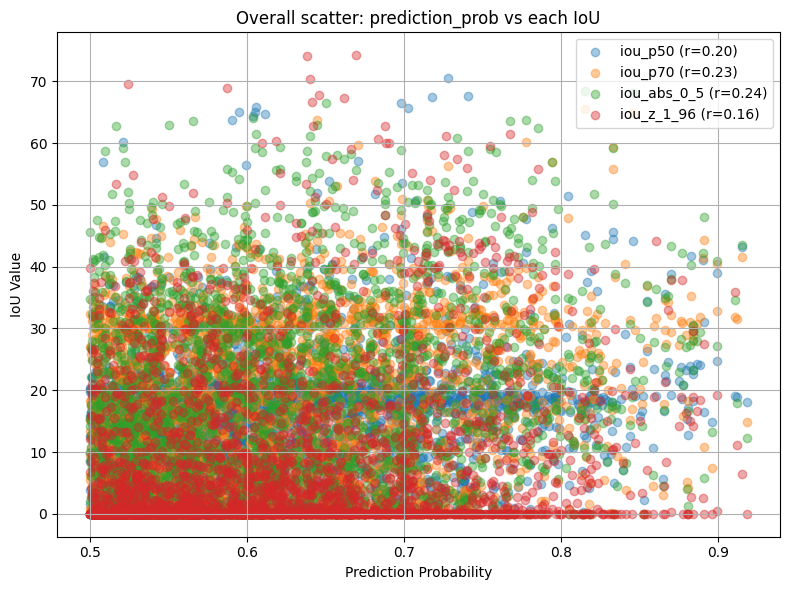

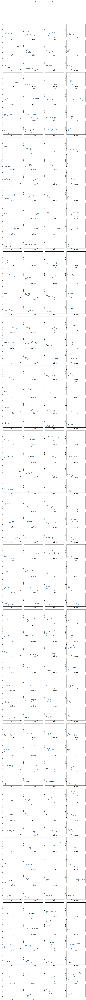

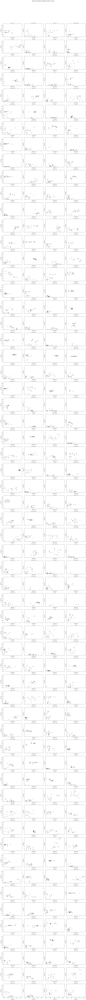

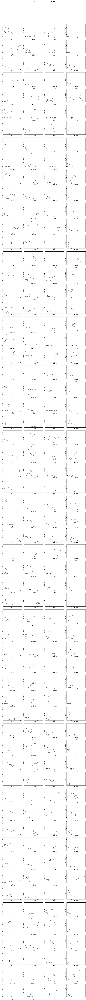

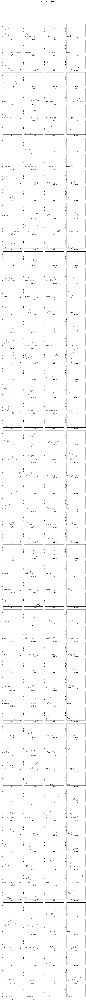

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load CSV
csv_path = '/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/results/gradcam/gradcam-metrics_300_15_4thresholds.csv'
df = pd.read_csv(csv_path)

# 2. Prepare a função que, dado um nome de coluna IoU, retorna o DataFrame de correlações per-sequence
def per_sequence_corr(df, iou_col):
    results = []
    for seq, group in df.groupby('sequence'):
        correct = group[group['predicted_class'] == group['ground_truth']]
        wrong   = group[group['predicted_class'] != group['ground_truth']]

        def safe_corr(x, y):
            return x.corr(y) if len(x) >= 2 else float('nan')

        results.append({
            'sequence':     seq,
            'n_correct':    len(correct),
            'n_wrong':      len(wrong),
            f'corr_correct_{iou_col}': safe_corr(correct['prediction_prob'], correct[iou_col]),
            f'corr_wrong_{iou_col}':   safe_corr(wrong  ['prediction_prob'], wrong  [iou_col])
        })
    return pd.DataFrame(results)

# 3. Compute one table per IoU
iou_cols = ['iou_p50', 'iou_p70', 'iou_abs_0_5', 'iou_z_1_96']
corr_tables = {iou: per_sequence_corr(df, iou) for iou in iou_cols}

# 4. Print each correlation table
for iou, table in corr_tables.items():
    print(f"\nPer-sequence correlation (prediction_prob vs {iou}):\n")
    print(table.to_string(index=False))

# 5. Scatter plots: para cada IoU, plot geral (todas as sequências juntas)
plt.figure(figsize=(8,6))
for iou in iou_cols:
    overall_corr = df[['prediction_prob', iou]].corr().iloc[0,1]
    plt.scatter(df['prediction_prob'], df[iou], alpha=0.4, label=f"{iou} (r={overall_corr:.2f})")

plt.xlabel('Prediction Probability')
plt.ylabel('IoU Value')
plt.title('Overall scatter: prediction_prob vs each IoU')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 6. Scatter por sequência: para cada IoU, um grid de plots
for iou in iou_cols:
    seqs = df['sequence'].unique()
    n = len(seqs)
    cols = 4
    rows = (n + cols - 1)//cols
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 3*rows), sharex=True, sharey=True)
    axes = axes.flatten()

    for ax, seq in zip(axes, seqs):
        sub = df[df['sequence'] == seq]
        ax.scatter(sub['prediction_prob'], sub[iou], alpha=0.6, edgecolor='k')
        ax.set_title(seq, fontsize=8)
        ax.set_xlabel('pred_prob')
        ax.set_ylabel(iou)
    # desativa eixos sobrando
    for ax in axes[len(seqs):]:
        ax.axis('off')

    plt.suptitle(f'Scatter per sequence: prediction_prob vs {iou}', y=1.02)
    plt.tight_layout()
    plt.show()


/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2704: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Sequences with corr ≥ +0.5: 53
Sequences with corr ≤ –0.5: 33


/tmp/ipykernel_127607/3883928431.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


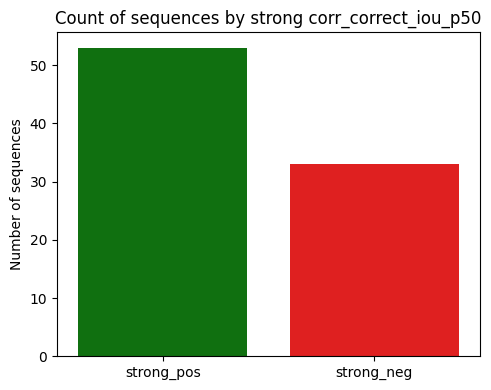

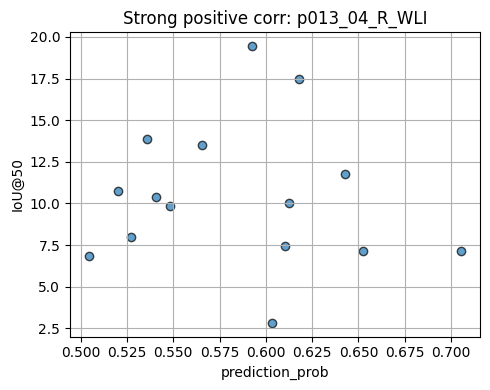

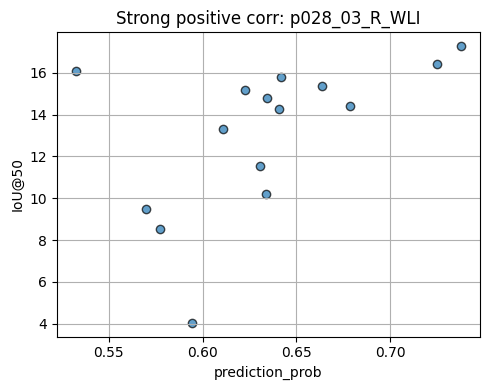

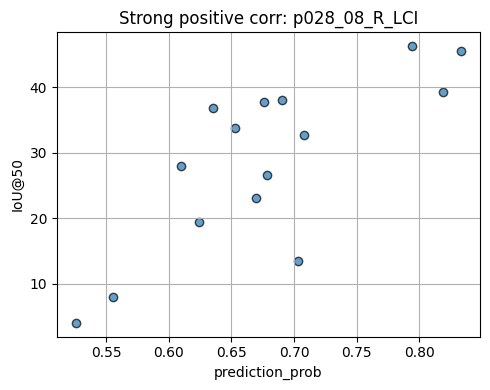

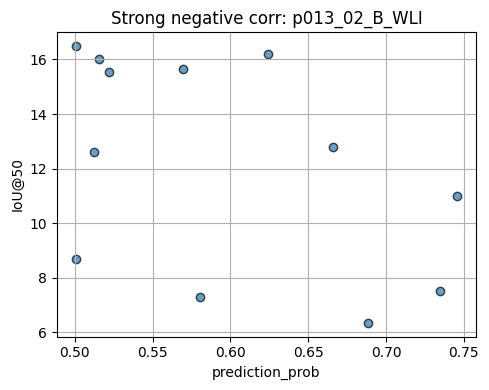

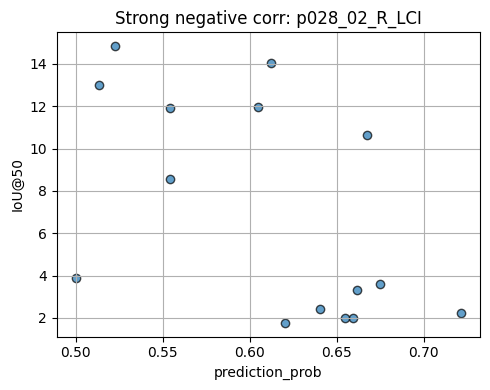

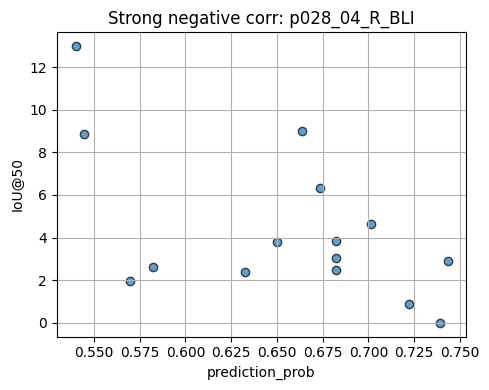

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load the full metrics CSV
metrics_path = (
    "/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/"
    "polypclassificationmi/results/gradcam/"
    "gradcam-metrics_300_15_4thresholds.csv"
)
df = pd.read_csv(metrics_path)

# 2. Compute per-sequence corr for IoU@50
def per_sequence_corr(df, iou_col="iou_p50"):
    records = []
    for seq, group in df.groupby("sequence"):
        corr_correct = (
            group[group.predicted_class == group.ground_truth]
            ["prediction_prob"]
            .corr(group[group.predicted_class == group.ground_truth][iou_col])
        )
        corr_wrong = (
            group[group.predicted_class != group.ground_truth]
            ["prediction_prob"]
            .corr(group[group.predicted_class != group.ground_truth][iou_col])
        )
        records.append({
            "sequence": seq,
            "n_correct": int((group.predicted_class == group.ground_truth).sum()),
            "n_wrong":   int((group.predicted_class != group.ground_truth).sum()),
            "corr_correct_iou_p50": corr_correct,
            "corr_wrong_iou_p50":   corr_wrong
        })
    return pd.DataFrame(records)

corr_df = per_sequence_corr(df, "iou_p50")

# 3. Filter sequences
strong_pos = corr_df[corr_df["corr_correct_iou_p50"] >=  0.5]["sequence"]
strong_neg = corr_df[corr_df["corr_correct_iou_p50"] <= -0.5]["sequence"]

print(f"Sequences with corr ≥ +0.5: {len(strong_pos)}")
print(f"Sequences with corr ≤ –0.5: {len(strong_neg)}")

# 4. Bar chart of counts
plt.figure(figsize=(5,4))
sns.barplot(
    x=["strong_pos", "strong_neg"],
    y=[len(strong_pos), len(strong_neg)],
    palette=["green","red"]
)
plt.ylabel("Number of sequences")
plt.title("Count of sequences by strong corr_correct_iou_p50")
plt.tight_layout()
plt.show()

# 5. Scatter‐plot examples
def plot_examples(seq_list, title):
    for seq in seq_list[:3]:  # up to 3 examples each
        sub = df[df["sequence"] == seq]
        plt.figure(figsize=(5,4))
        plt.scatter(
            sub["prediction_prob"],
            sub["iou_p50"],
            alpha=0.7,
            edgecolor="k"
        )
        plt.xlabel("prediction_prob")
        plt.ylabel("IoU@50")
        plt.title(f"{title} {seq}")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

plot_examples(strong_pos.tolist(), "Strong positive corr:")
plot_examples(strong_neg.tolist(), "Strong negative corr:")


In [22]:
import numpy as np
import pandas as pd

def compute_ece(df, prob_col='prediction_prob', correct_col='correct', n_bins=10):
    """
    Compute Expected Calibration Error (ECE).

    Parameters:
    - df: pandas.DataFrame com colunas:
        * prob_col: probabilidade prevista pelo modelo
        * correct_col: booleano (True para acerto, False para erro)
    - n_bins: número de bins de confiança iguais em [0,1]

    Returns:
    - ece: float, ECE ponderado
    - details: DataFrame com estatísticas por bin
    """
    probs = df[prob_col].to_numpy()
    # garante 0/1 em vez de True/False
    correct = df[correct_col].astype(int).to_numpy()

    # criar bins
    bin_edges = np.linspace(0.0, 1.0, n_bins + 1)
    ece = 0.0
    records = []

    # para cada bin, calcular média de confiança, precisão e gap
    for i in range(n_bins):
        lower, upper = bin_edges[i], bin_edges[i+1]
        # incluímos o lower, excluímos o upper no último bin incluímos ambos
        if i < n_bins - 1:
            in_bin = (probs >= lower) & (probs < upper)
        else:
            in_bin = (probs >= lower) & (probs <= upper)

        prop = in_bin.mean()  # peso
        if prop > 0:
            conf_bin = probs[in_bin].mean()
            acc_bin  = correct[in_bin].mean()
            gap      = abs(acc_bin - conf_bin)
            ece += prop * gap
            records.append({
                'bin_lower':   lower,
                'bin_upper':   upper,
                'confidence':  conf_bin,
                'accuracy':    acc_bin,
                'weight':      prop,
                'abs_gap':     gap
            })

    details = pd.DataFrame(records)
    return ece, details

# Exemplo de uso
csv_path = '/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/results/gradcam/gradcam-metrics_300_15_4thresholds.csv'
df = pd.read_csv(csv_path)

# criar flag 'correct'
df['correct'] = df['predicted_class'] == df['ground_truth']

ece_value, ece_details = compute_ece(df, prob_col='prediction_prob', correct_col='correct', n_bins=10)
print(f"ECE: {ece_value:.4f}")
print(ece_details)


ECE: 0.0509
   bin_lower  bin_upper  confidence  accuracy    weight   abs_gap
0        0.5        0.6    0.547676  0.545716  0.509821  0.001960
1        0.6        0.7    0.644034  0.707865  0.313105  0.063832
2        0.7        0.8    0.740029  0.913758  0.142773  0.173729
3        0.8        0.9    0.839456  0.991150  0.033128  0.151695
4        0.9        1.0    0.913975  1.000000  0.001173  0.086025


Overall correlations with iou_adaptive:
score              0.222888
prediction_prob    0.180575
laplacian_var     -0.067424
hist_skewness     -0.053957
com_adaptive_x    -0.131137
com_adaptive_y    -0.065689
com_gt_x          -0.056344
com_gt_y          -0.140425 



/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2704: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-p

Per-sequence correlation (score vs iou_adaptive):
     sequence  n_correct  n_wrong  corr_correct_score_iou_adaptive  corr_wrong_score_iou_adaptive
p013_02_B_WLI         11        1                        -0.516502                            NaN
p013_04_R_WLI          6        9                        -0.695657                      -0.750061
p028_01_R_WLI          6        9                         0.608566                       0.644166
p028_03_R_WLI         14        1                         0.875863                            NaN
p028_04_R_BLI         15        0                        -0.638220                            NaN
p028_07_R_WLI         14        1                        -0.038100                            NaN
p028_08_R_LCI         15        0                         0.420477                            NaN
p028_09_R_WLI         13        2                        -0.693656                       1.000000
p028_10_R_BLI         15        0                        -0.113141  

/tmp/ipykernel_127607/3801880186.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette=['green','red'])


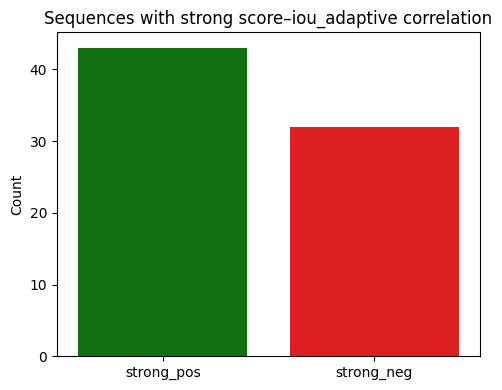

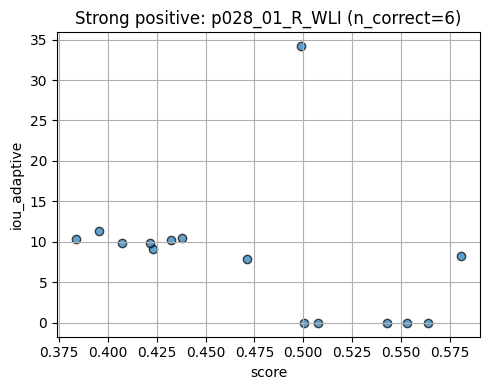

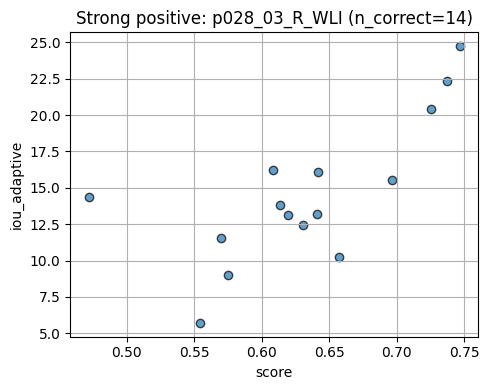

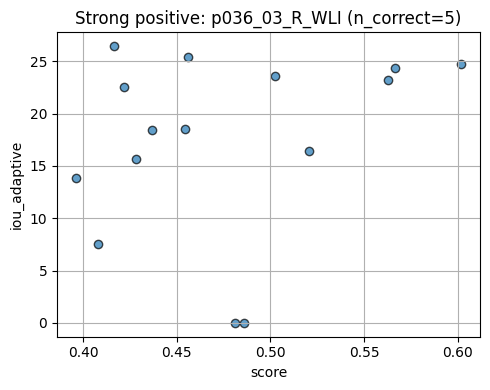

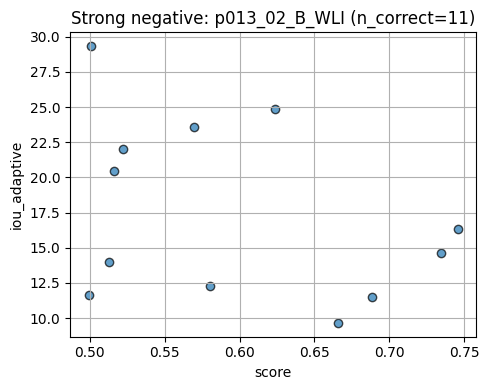

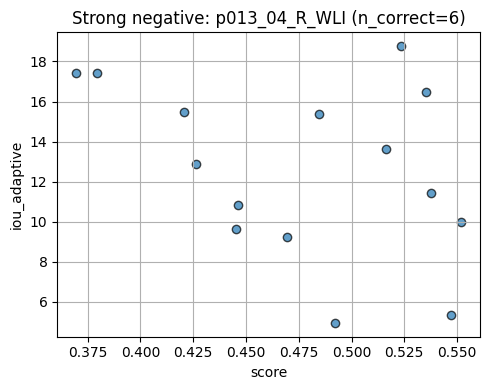

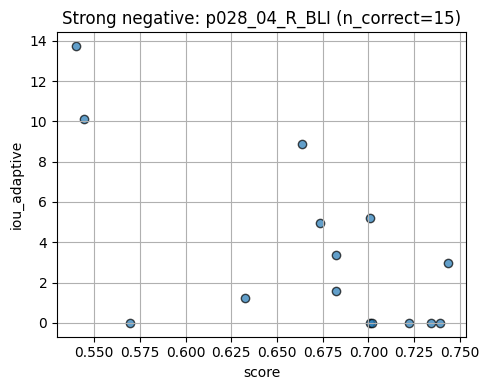

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load the adaptive-threshold metrics CSV
csv_path = (
    "/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/"
    "polypclassificationmi/results/gradcam/gradcam-metrics_adaptive.csv"
)
df = pd.read_csv(csv_path)

# 2. Compute unified 'score' as before:
#    - if correct:  score = prediction_prob
#    - if wrong:    score = 1 - prediction_prob
df['correct'] = df['predicted_class'] == df['ground_truth']
df['score']   = df.apply(lambda r: r['prediction_prob'] if r['correct']
                         else 1.0 - r['prediction_prob'], axis=1)

# 3. Overall correlation between iou_adaptive and each variable
vars_of_interest = [
    'score', 'prediction_prob',
    'laplacian_var', 'hist_skewness',
    'com_adaptive_x', 'com_adaptive_y',
    'com_gt_x', 'com_gt_y'
]
overall_corr = df[['iou_adaptive'] + vars_of_interest].corr()['iou_adaptive'].drop('iou_adaptive')
print("Overall correlations with iou_adaptive:")
print(overall_corr.to_string(), "\n")

# 4. Per-sequence Pearson corr (correct vs wrong) between score and iou_adaptive
records = []
for seq, g in df.groupby('sequence'):
    corr_corr = g[g['correct']]['score'].corr(g[g['correct']]['iou_adaptive'])
    corr_wrong = g[~g['correct']]['score'].corr(g[~g['correct']]['iou_adaptive'])
    records.append({
        'sequence': seq,
        'n_correct': int(g['correct'].sum()),
        'n_wrong':   int((~g['correct']).sum()),
        'corr_correct_score_iou_adaptive': corr_corr,
        'corr_wrong_score_iou_adaptive':   corr_wrong
    })
corr_seq_df = pd.DataFrame(records)
print("Per-sequence correlation (score vs iou_adaptive):")
print(corr_seq_df.to_string(index=False), "\n")

# 5. Filter sequences with strong correlation in correct cases (|r| ≥ 0.5)
strong_pos = corr_seq_df[corr_seq_df['corr_correct_score_iou_adaptive'] >=  0.5]['sequence'].tolist()
strong_neg = corr_seq_df[corr_seq_df['corr_correct_score_iou_adaptive'] <= -0.5]['sequence'].tolist()
print(f"Sequences with corr_correct ≥ +0.5: {len(strong_pos)}")
print(f"Sequences with corr_correct ≤ –0.5: {len(strong_neg)}\n")

# 6. Bar chart of how many sequences are strongly correlated
counts = {'strong_pos': len(strong_pos), 'strong_neg': len(strong_neg)}
plt.figure(figsize=(5,4))
sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette=['green','red'])
plt.title("Sequences with strong score–iou_adaptive correlation")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# 7. Scatter plots for top examples in each group
def plot_hits(seqs, label):
    for seq in seqs[:3]:
        sub = df[df['sequence']==seq]
        plt.figure(figsize=(5,4))
        plt.scatter(sub['score'], sub['iou_adaptive'], alpha=0.7, edgecolor='k')
        plt.xlabel('score')
        plt.ylabel('iou_adaptive')
        plt.title(f"{label} {seq} (n_correct={int(sub['correct'].sum())})")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

plot_hits(strong_pos, 'Strong positive:')
plot_hits(strong_neg, 'Strong negative:')


Global correlations with iou_positive:
score            0.202088
probability      0.301500
laplacian_var    0.292430
skewness        -0.052154
com_pos_x       -0.264886
com_pos_y       -0.120181
com_neg_x       -0.269497
com_neg_y       -0.118622 

Per-sequence correlation (score vs. iou_positive):
sequence  n_correct  n_wrong  corr_correct_score_iou  corr_wrong_score_iou
    p047         20        0                0.029411                   NaN
    p175         19        1                0.657550                   NaN
    p196         20        0                0.233498                   NaN
    p204         20        0                0.111209                   NaN
    p207         17        3               -0.006360             -0.225142
    p228          0       20                     NaN              0.205757
    p233         16        4                0.376088              0.831409
    p243         20        0                0.312140                   NaN
    p267         17      

/tmp/ipykernel_127607/2378816653.py:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


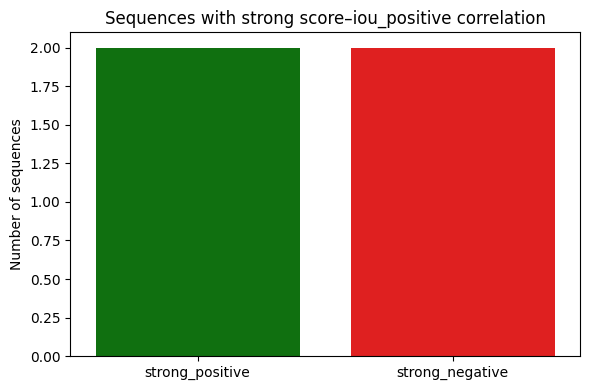

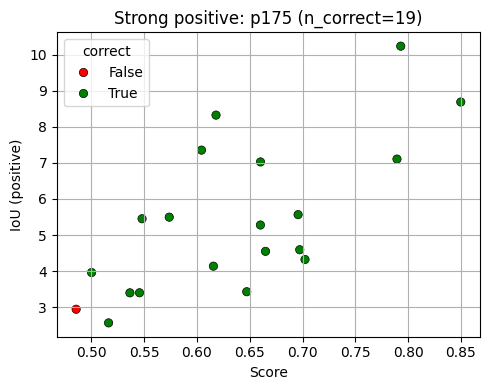

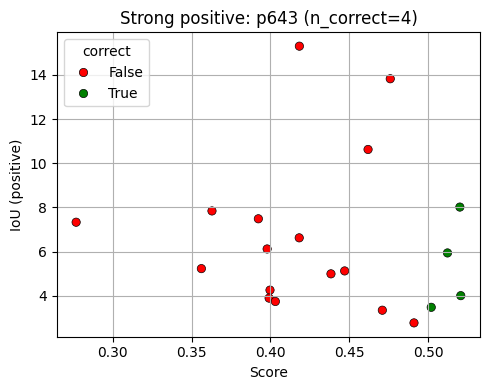

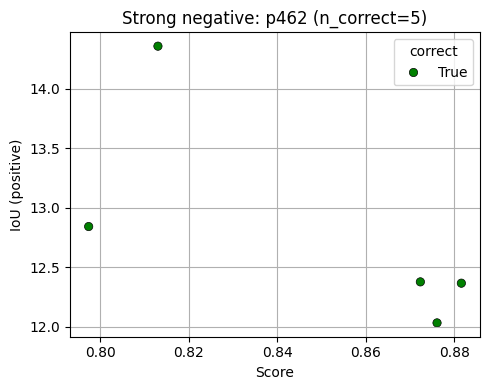

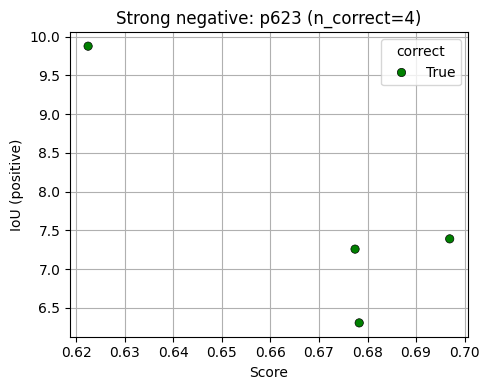

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load the metrics CSV
csv_path = (
    "/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/"
    "polypclassificationmi/results/result_sequence/results.csv"
)
df = pd.read_csv(csv_path)

# 2. Compute a unified 'score':
#    - if prediction is correct:  score = probability
#    - if prediction is wrong:    score = 1 - probability
df['correct'] = df['predicted_class'] == df['ground_truth']
df['score']   = df.apply(
    lambda row: row['probability'] if row['correct']
                else 1.0 - row['probability'],
    axis=1
)

# 3. Overall correlation between iou_positive and variables of interest
vars_of_interest = [
    'score', 'probability',
    'laplacian_var', 'skewness',
    'com_pos_x', 'com_pos_y',
    'com_neg_x', 'com_neg_y'
]
overall_corr = (
    df[['iou_positive'] + vars_of_interest]
      .corr()['iou_positive']
      .drop('iou_positive')
)
print("Global correlations with iou_positive:")
print(overall_corr.to_string(), "\n")

# 4. Per-sequence Pearson correlation (correct vs. wrong) between score and iou_positive
records = []
for seq, group in df.groupby('sequence'):
    def safe_corr(series_a, series_b):
        return series_a.corr(series_b) \
            if len(series_a) >= 2 and len(series_b) >= 2 \
            else float('nan')

    corr_correct = safe_corr(
        group[group['correct']]['score'],
        group[group['correct']]['iou_positive']
    )
    corr_wrong = safe_corr(
        group[~group['correct']]['score'],
        group[~group['correct']]['iou_positive']
    )
    records.append({
        'sequence': seq,
        'n_correct': int(group['correct'].sum()),
        'n_wrong':   int((~group['correct']).sum()),
        'corr_correct_score_iou': corr_correct,
        'corr_wrong_score_iou':   corr_wrong
    })

corr_seq_df = pd.DataFrame(records)
print("Per-sequence correlation (score vs. iou_positive):")
print(corr_seq_df.to_string(index=False), "\n")

# 5. Identify sequences with strong correlation in correct cases (|r| ≥ 0.5)
strong_positive = corr_seq_df[
    corr_seq_df['corr_correct_score_iou'] >=  0.5
]['sequence'].tolist()
strong_negative = corr_seq_df[
    corr_seq_df['corr_correct_score_iou'] <= -0.5
]['sequence'].tolist()

print(f"Sequences with corr_correct ≥ +0.5: {len(strong_positive)} → {strong_positive}")
print(f"Sequences with corr_correct ≤ –0.5: {len(strong_negative)} → {strong_negative}\n")

# 6. Bar chart of number of sequences with strong correlations
counts = {
    'strong_positive': len(strong_positive),
    'strong_negative': len(strong_negative)
}
plt.figure(figsize=(6,4))
sns.barplot(
    x=list(counts.keys()),
    y=list(counts.values()),
    palette=['green','red']
)
plt.title("Sequences with strong score–iou_positive correlation")
plt.ylabel("Number of sequences")
plt.tight_layout()
plt.show()

# 7. Scatter plots for the top 3 sequences in each group
def plot_sequence_scatter(seqs, label):
    for seq in seqs[:3]:
        subset = df[df['sequence'] == seq]
        plt.figure(figsize=(5,4))
        sns.scatterplot(
            x='score', y='iou_positive',
            hue='correct',
            data=subset,
            palette={True: 'green', False: 'red'},
            edgecolor='k'
        )
        plt.xlabel('Score')
        plt.ylabel('IoU (positive)')
        plt.title(f"{label} {seq} (n_correct={int(subset['correct'].sum())})")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

plot_sequence_scatter(strong_positive, 'Strong positive:')
plot_sequence_scatter(strong_negative, 'Strong negative:')


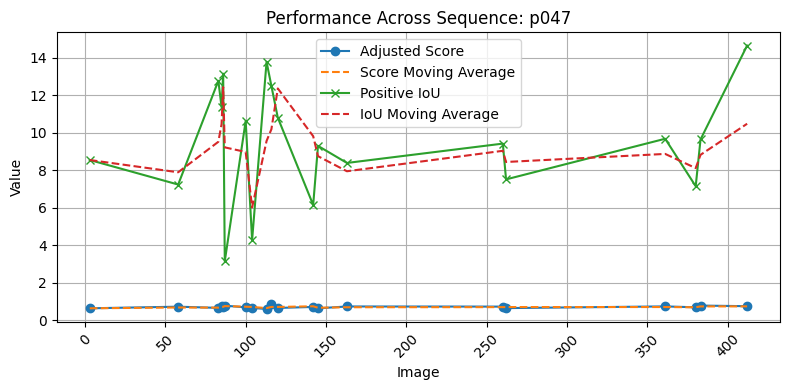

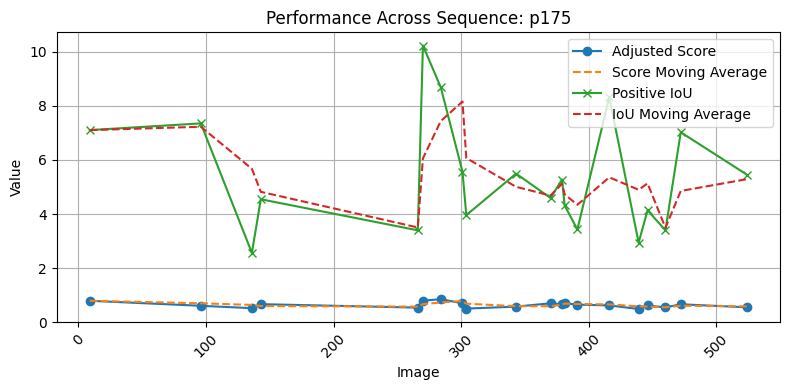

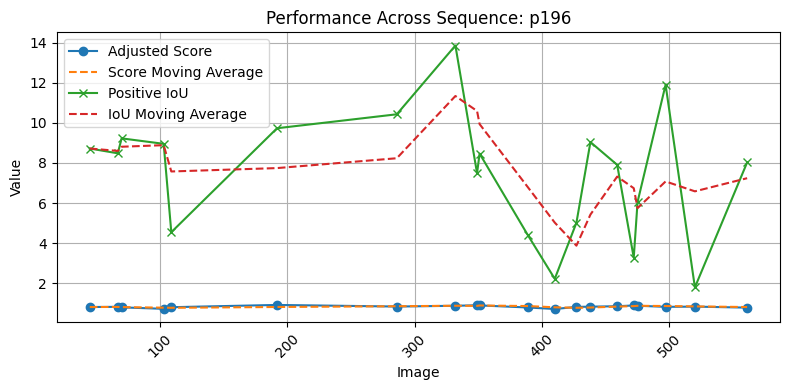

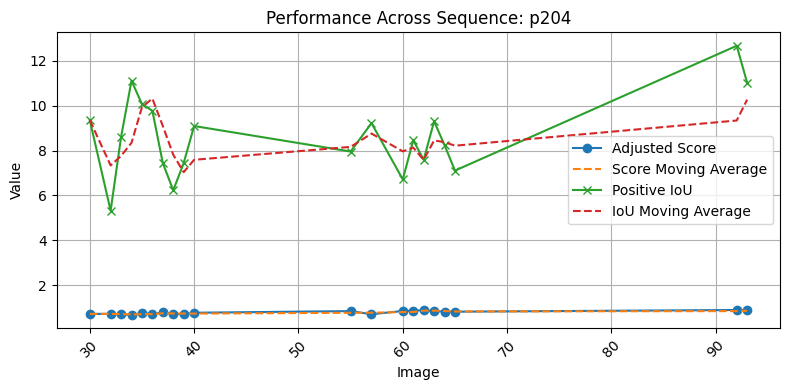

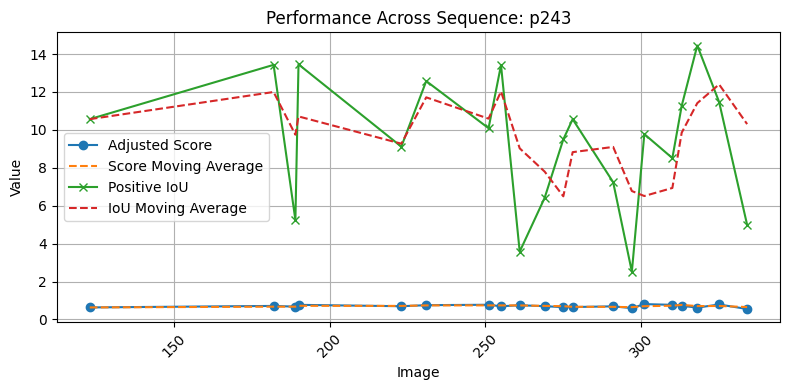

...

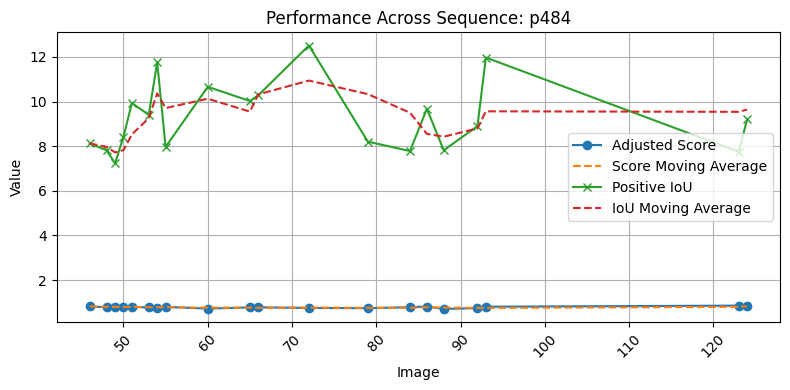

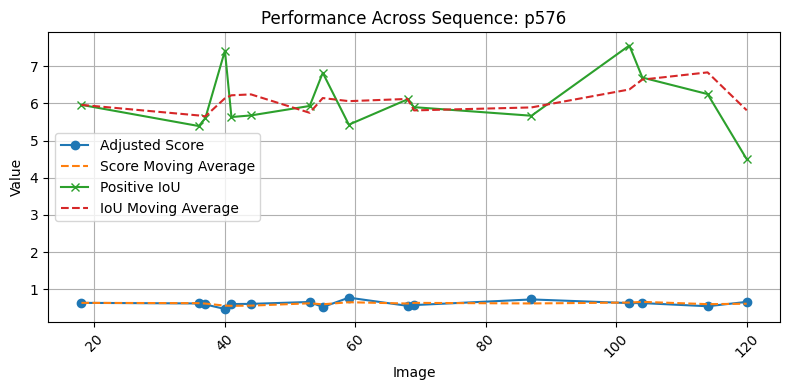

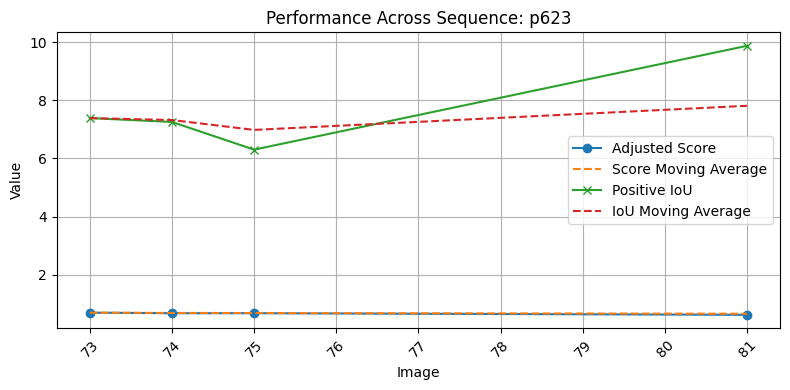

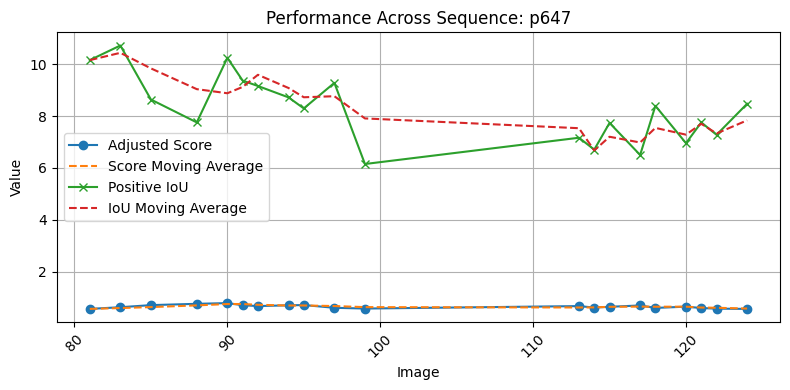

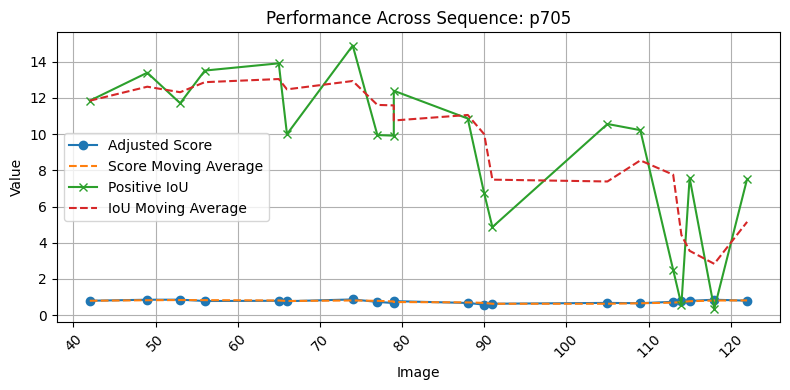

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
csv_path = '/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/results/result_sequence/results7.csv'
df = pd.read_csv(csv_path)

# Determine if the prediction is correct
df['correct'] = df['predicted_class'] == df['ground_truth']

# Calculate the adjusted 'score'
df['score'] = df.apply(
    lambda row: row['probability'] if row['correct'] else 1.0 - row['probability'],
    axis=1
)

# Select sequences with high accuracy (e.g., ≥ 90%)
sequence_accuracy = df.groupby('sequence')['correct'].mean()
high_accuracy_sequences = sequence_accuracy[sequence_accuracy >= 0.9].index

# Analyze performance variation across images within each high-accuracy sequence
for seq in high_accuracy_sequences:
    seq_data = df[df['sequence'] == seq].copy()
    seq_data = seq_data.sort_values('image')  # Assuming 'image' indicates temporal order

    # Calculate the moving average of the adjusted 'score'
    seq_data['score_moving_avg'] = seq_data['score'].rolling(window=3, min_periods=1).mean()

    # Calculate the moving average of the positive IoU
    seq_data['iou_moving_avg'] = seq_data['iou_positive'].rolling(window=3, min_periods=1).mean()

    # Plot the metrics across the sequence with a smaller figure size
    plt.figure(figsize=(8, 4))  # Reduced figure size from (12, 6) to (8, 4)
    plt.plot(seq_data['image'], seq_data['score'], label='Adjusted Score', marker='o')
    plt.plot(seq_data['image'], seq_data['score_moving_avg'], label='Score Moving Average', linestyle='--')
    plt.plot(seq_data['image'], seq_data['iou_positive'], label='Positive IoU', marker='x')
    plt.plot(seq_data['image'], seq_data['iou_moving_avg'], label='IoU Moving Average', linestyle='--')
    plt.title(f'Performance Across Sequence: {seq}')
    plt.xlabel('Image')
    plt.ylabel('Value')
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [1]:
import pandas as pd

# adapte o caminho para o seu CSV
df = pd.read_csv("/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/results/gradcam/metrics_5seq_10frames.csv")
display(df.head())
print(df.info())
print(df.describe())


,sequence,image,predicted_class,probability,ground_truth,correct,iou,laplacian_var,skewness,com_pos_x,com_pos_y,dist_center,com_neg_x,com_neg_y
0,p267_01_R_BLI,00165.png,0,0.703127,1,0,0.451395,1492.620012,-0.439069,157.327573,175.853175,0.474589,123.463325,120.956188
1,p267_01_R_BLI,00118.png,0,0.710451,1,0,0.395199,2033.240061,-0.186862,160.100659,87.683481,0.555031,125.153137,130.366320
2,p267_01_R_BLI,00040.png,0,0.668654,1,0,0.214722,2744.656071,0.181136,131.691164,189.476636,0.542568,127.343848,125.190909
3,p267_01_R_BLI,00244.png,0,0.661539,1,0,0.345936,2032.833467,-0.290035,159.993830,85.062232,0.541611,125.540108,130.059669
4,p267_01_R_BLI,00249.png,0,0.689767,1,0,0.365947,2605.575002,-0.164789,162.099055,90.513312,0.569114,125.552085,129.582338


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sequence         50 non-null     object 
 1   image            50 non-null     object 
 2   predicted_class  50 non-null     int64  
 3   probability      50 non-null     float64
 4   ground_truth     50 non-null     int64  
 5   correct          50 non-null     int64  
 6   iou              50 non-null     float64
 7   laplacian_var    50 non-null     float64
 8   skewness         50 non-null     float64
 9   com_pos_x        50 non-null     float64
 10  com_pos_y        50 non-null     float64
 11  dist_center      50 non-null     float64
 12  com_neg_x        50 non-null     float64
 13  com_neg_y        50 non-null     float64
dtypes: float64(9), int64(3), object(2)
memory usage: 5.6+ KB
None
       predicted_class  probability  ground_truth    correct        iou  \
count        50.000

In [3]:
# Compute a unified score: if prediction is correct, use the probability; otherwise, use (1 – probability)
df['score'] = df.apply(
    lambda row: row['probability'] if row['correct'] == 1 else 1.0 - row['probability'],
    axis=1
)

# 3) Per-sequence correlation between score and IoU
seq_corr = (
    df
    .groupby('sequence')
    .apply(lambda group: pd.Series({
        'n_frames':        len(group),
        'corr_score_iou':  group['score'].corr(group['iou'])
    }))
    .reset_index()
)
print("Score vs IoU Correlation (by sequence):")
print(seq_corr)

# 4) Global correlations: IoU vs other variables
pairs = {
    'IoU vs laplacian_var':   ('iou', 'laplacian_var'),
    'IoU vs skewness':        ('iou', 'skewness'),
    'IoU vs dist_center':     ('iou', 'dist_center'),
}

print("\nGlobal Correlations:")
for name, (col_a, col_b) in pairs.items():
    corr_value = df[col_a].corr(df[col_b])
    print(f"  {name}: {corr_value:.3f}")


Score vs IoU Correlation (by sequence):
        sequence  n_frames  corr_score_iou
0  p047_01_R_WLI      10.0       -0.121660
1  p214_02_R_BLI      10.0        0.676302
2  p267_01_R_BLI      10.0       -0.200607
3  p300_01_R_LCI      10.0       -0.682666
4        p525_08      10.0             NaN

Global Correlations:
  IoU vs laplacian_var: 0.599
  IoU vs skewness: -0.185
  IoU vs dist_center: -0.242


/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_2319312/3409565487.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: pd.Series({


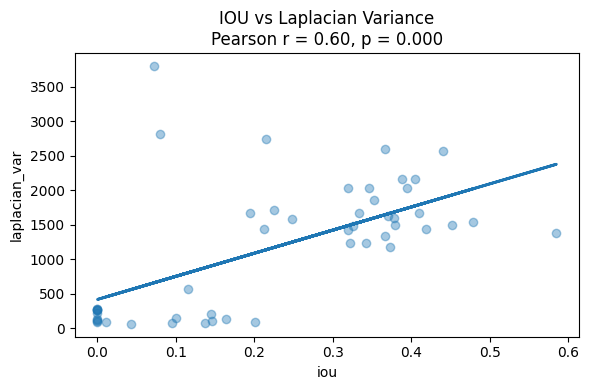

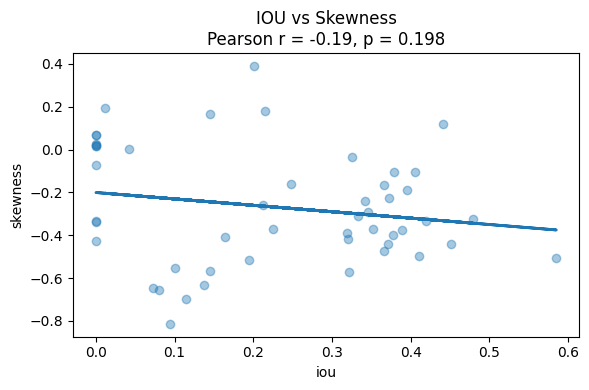

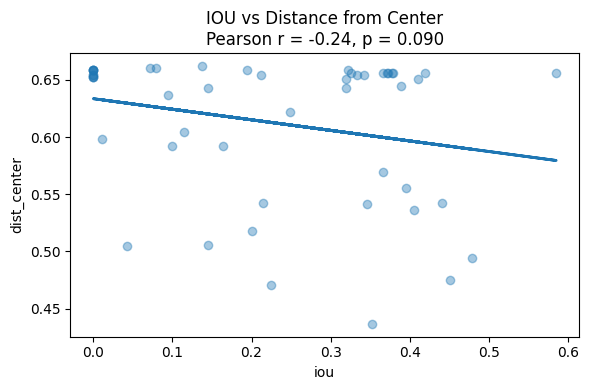

/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_2319312/1547600364.py:73: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, _ = pearsonr(x0[idx], y0[idx])


Bootstrap 95% CI for Score vs IOU per sequence:
        sequence  n_frames  r_empirical  r_bootstrap_mean  ci95_lower  \
0  p047_01_R_WLI        10    -0.121660         -0.129253   -0.623899   
1  p214_02_R_BLI        10     0.676302          0.627857    0.015730   
2  p267_01_R_BLI        10    -0.200607         -0.205277   -0.733563   
3  p300_01_R_LCI        10    -0.682666         -0.639359   -0.936000   
4        p525_08        10          NaN               NaN         NaN   

   ci95_upper  
0    0.465536  
1    0.908916  
2    0.523054  
3   -0.025609  
4         NaN  


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from tqdm import tqdm

# --- 1) Load data and compute custom score ---
df = pd.read_csv("/DATASERVER/MIC/GENERAL/STUDENTS/amartic/mscthesis/polypclassificationmi/results/gradcam/metrics_5seq_10frames.csv")

# If prediction is correct: score = probability; otherwise score = 1 - probability
df['score'] = df.apply(
    lambda row: row['probability'] if row['correct'] == 1 else 1.0 - row['probability'],
    axis=1
)

# --- 2) Helper function: scatter plot, regression line, and Pearson test ---
def scatter_with_regression(x, y, xlabel, ylabel, title):
    # Remove NaNs
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x_clean = x[mask].reshape(-1, 1)
    y_clean = y[mask]
    
    # Compute Pearson correlation and p-value
    r, p_value = pearsonr(x_clean.ravel(), y_clean)
    
    # Fit a simple linear regression
    model = LinearRegression().fit(x_clean, y_clean)
    y_pred = model.predict(x_clean)
    
    # Plot
    plt.figure(figsize=(6, 4))
    plt.scatter(x_clean, y_clean, alpha=0.4)
    plt.plot(x_clean, y_pred, linewidth=2)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(f"{title}\nPearson r = {r:.2f}, p = {p_value:.3f}")
    plt.tight_layout()
    plt.show()
    
    return r, p_value

# --- 3) Generate global scatter plots for selected variable pairs ---
pairs = {
    'IOU vs Laplacian Variance':    ('iou', 'laplacian_var'),
    'IOU vs Skewness':              ('iou', 'skewness'),
    'IOU vs Distance from Center':  ('iou', 'dist_center'),
}

global_results = {}
for title, (x_col, y_col) in pairs.items():
    r, p = scatter_with_regression(
        df[x_col].values, df[y_col].values,
        xlabel=x_col, ylabel=y_col, title=title
    )
    global_results[title] = {'r': r, 'p_value': p}

# --- 4) Bootstrap 95% confidence intervals for Score vs IOU per sequence ---
def bootstrap_correlation(x, y, n_bootstrap=2000, ci=95):
    """
    Returns: (mean_r, lower_bound, upper_bound)
    for Pearson correlation via bootstrap resampling.
    """
    # Remove NaNs
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x0 = x[mask]
    y0 = y[mask]
    N = len(x0)
    rs = []
    rng = np.random.default_rng()
    for _ in range(n_bootstrap):
        idx = rng.integers(0, N, N)
        r, _ = pearsonr(x0[idx], y0[idx])
        rs.append(r)
    lower = np.percentile(rs, (100 - ci) / 2)
    upper = np.percentile(rs, 100 - (100 - ci) / 2)
    return np.mean(rs), lower, upper

bootstrap_results = []
for sequence, group in df.groupby('sequence'):
    if group[['score', 'iou']].dropna().shape[0] < 5:
        # Skip sequences with fewer than 5 valid samples
        continue
    r_empirical = group['score'].corr(group['iou'])
    r_mean, ci_lower, ci_upper = bootstrap_correlation(
        group['score'].values,
        group['iou'].values,
        n_bootstrap=2000,
        ci=95
    )
    bootstrap_results.append({
        'sequence': sequence,
        'n_frames': len(group),
        'r_empirical': r_empirical,
        'r_bootstrap_mean': r_mean,
        'ci95_lower': ci_lower,
        'ci95_upper': ci_upper
    })

bootstrap_df = pd.DataFrame(bootstrap_results)
print("Bootstrap 95% CI for Score vs IOU per sequence:")
print(bootstrap_df)
